<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#READ-ME" data-toc-modified-id="READ-ME-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>READ ME</a></span></li><li><span><a href="#Define-paths" data-toc-modified-id="Define-paths-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Define paths</a></span></li><li><span><a href="#Load-expiration-table" data-toc-modified-id="Load-expiration-table-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Load expiration table</a></span><ul class="toc-item"><li><span><a href="#Change-format" data-toc-modified-id="Change-format-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Change format</a></span></li></ul></li><li><span><a href="#Build-perpetual-time-series" data-toc-modified-id="Build-perpetual-time-series-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Build perpetual time series</a></span><ul class="toc-item"><li><span><a href="#Define-perpetual-time-series-parameters" data-toc-modified-id="Define-perpetual-time-series-parameters-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Define perpetual time series parameters</a></span></li><li><span><a href="#Load-all-contracts-indexes" data-toc-modified-id="Load-all-contracts-indexes-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Load all contracts indexes</a></span></li><li><span><a href="#Prepare-weights" data-toc-modified-id="Prepare-weights-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Prepare weights</a></span></li><li><span><a href="#Get-trades-and-quotes-for-the-first-contract" data-toc-modified-id="Get-trades-and-quotes-for-the-first-contract-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Get trades and quotes for the first contract</a></span><ul class="toc-item"><li><span><a href="#Save-first-contract" data-toc-modified-id="Save-first-contract-4.4.1"><span class="toc-item-num">4.4.1&nbsp;&nbsp;</span>Save first contract</a></span></li></ul></li><li><span><a href="#Get-perpetual-time-series" data-toc-modified-id="Get-perpetual-time-series-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Get perpetual time series</a></span><ul class="toc-item"><li><span><a href="#Perpetual-features" data-toc-modified-id="Perpetual-features-4.5.1"><span class="toc-item-num">4.5.1&nbsp;&nbsp;</span>Perpetual features</a></span></li><li><span><a href="#Save-perpetual-time-series" data-toc-modified-id="Save-perpetual-time-series-4.5.2"><span class="toc-item-num">4.5.2&nbsp;&nbsp;</span>Save perpetual time series</a></span></li></ul></li></ul></li><li><span><a href="#Check-that-the-procedure-makes-sense" data-toc-modified-id="Check-that-the-procedure-makes-sense-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Check that the procedure makes sense</a></span></li><li><span><a href="#Build-bar-objects-for-perpetual-and-first-contract" data-toc-modified-id="Build-bar-objects-for-perpetual-and-first-contract-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Build bar objects for perpetual and first contract</a></span><ul class="toc-item"><li><span><a href="#First-contract" data-toc-modified-id="First-contract-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>First contract</a></span></li><li><span><a href="#Perpetual-Time-Series" data-toc-modified-id="Perpetual-Time-Series-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Perpetual Time Series</a></span></li></ul></li></ul></div>

# READ ME

This notebook creates the perpetual timeseries for trades and quotes 

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import datetime
import numpy as np
import os
import gc

/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/importlib/_bootstrap.py:205: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


# Define paths

In [3]:
file_path = '../clean_data/bar_obj_5S/'
bars_files = [file_path+f for f in os.listdir(file_path) if f.endswith('.pickle')]

In [4]:
symbols = [f.replace('.pickle', '') for f in os.listdir(file_path) if f.endswith('.pickle')]

In [5]:
path_dict = {}

for s in symbols:
    path_dict[s] = [x for x in bars_files if s in x][0]

# Load expiration table

In [6]:
# load contract dates
expiration_dates = pd.read_csv('../expiration_dates.csv', index_col=0)
expiration_dates['expiration_date'] = pd.to_datetime(expiration_dates['expiration_date'])
expiration_dates['expiration'] = pd.to_datetime(expiration_dates['expiration'])

## Change format

In [7]:
contract_expiration = expiration_dates.drop(['Symbol_start'], axis=1)
contract_expiration.rename(columns = {'Symbol_end':'Symbol'}, inplace=True)

In [8]:
contract_expiration['data_start'] = contract_expiration['expiration'].shift(1)  - datetime.timedelta(hours=23, days=28)
contract_expiration['data_start'].fillna(datetime.datetime(2008,12,1), inplace=True)

In [9]:
contract_expiration = contract_expiration[['Symbol', 'data_start', 'expiration']]\
                            .set_index('Symbol')\
                            .dropna()

In [10]:
contract_expiration['stop_trading_live'] = contract_expiration['expiration'] - datetime.timedelta(days=5)
contract_expiration['start_trading_live'] = (contract_expiration['stop_trading_live'] + datetime.timedelta(hours=1)).shift(1).fillna(datetime.datetime(2010,3,1))

In [11]:
expiration_dates = contract_expiration.copy()
contract_expiration = contract_expiration.to_dict('index')

# Build perpetual time series

## Define perpetual time series parameters

In [12]:
RESOLUTION='5S'
WEIGHT_LOOKBACK_ROWS = 120*12

## Load all contracts indexes

In [13]:
data_ls=[]
for i, s in enumerate(symbols):
    
    print('Loading {} ({} of {})...'.format(s, i+1, len(symbols)))

    file=path_dict[s]
    bar_obj = pd.read_pickle(file)
    
    df = bar_obj.df
    
    # set symbol column
    df['Symbol'] = s
    
    # set live trading flag
    df['is_live_trading'] = (df.index>=contract_expiration[s]['start_trading_live']) & (df.index<=contract_expiration[s]['stop_trading_live'])    
    
    # select contract weight
    df['w'] = df['Volume'].rolling(WEIGHT_LOOKBACK_ROWS).mean()
    
    # append data
    data_ls.append(df)
    
    del df
    gc.collect()
    
# concatenate all contracts
print('Concatenating contracts...')
all_contracts = pd.concat(data_ls)
del data_ls
gc.collect()

Loading COU11 (1 of 96)...


/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/importlib/_bootstrap.py:205: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)
/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


Loading COX17 (2 of 96)...
Loading COH14 (3 of 96)...
Loading COM14 (4 of 96)...
Loading COV15 (5 of 96)...
Loading COM10 (6 of 96)...
Loading COV11 (7 of 96)...
Loading CON15 (8 of 96)...
Loading COM13 (9 of 96)...
Loading COV12 (10 of 96)...
Loading COK15 (11 of 96)...
Loading COU16 (12 of 96)...
Loading COH15 (13 of 96)...
Loading COF18 (14 of 96)...
Loading CON13 (15 of 96)...
Loading COK10 (16 of 96)...
Loading COH17 (17 of 96)...
Loading COH12 (18 of 96)...
Loading COQ14 (19 of 96)...
Loading COU12 (20 of 96)...
Loading COV10 (21 of 96)...
Loading COQ13 (22 of 96)...
Loading COH16 (23 of 96)...
Loading COJ10 (24 of 96)...
Loading COM16 (25 of 96)...
Loading COM11 (26 of 96)...
Loading COF12 (27 of 96)...
Loading COM12 (28 of 96)...
Loading COV16 (29 of 96)...
Loading COJ17 (30 of 96)...
Loading COX15 (31 of 96)...
Loading COZ14 (32 of 96)...
Loading COJ14 (33 of 96)...
Loading COU17 (34 of 96)...
Loading COX16 (35 of 96)...
Loading COJ13 (36 of 96)...
Loading COX11 (37 of 96)...


665

## Prepare weights

In [14]:
# get perpetual weights
perpetual_weights = all_contracts[['Symbol', 'w']]
all_contracts.drop('w', inplace=True, axis=1)
perpetual_weights['tot_w'] = perpetual_weights.reset_index().groupby('DateTime', sort=False)['w'].sum()

/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [15]:
# set weights to nan if tot_w is zero
mask = (perpetual_weights['tot_w']==0)
perpetual_weights.loc[mask,['w', 'tot_w']] = np.nan

/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/site-packages/pandas/core/indexing.py:517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [16]:
# fill weights nans with the last weight seen
perpetual_weights['w'] = perpetual_weights.groupby('Symbol', sort=False)['w'].fillna(method='ffill')
perpetual_weights['w'] = perpetual_weights.groupby('Symbol', sort=False)['w'].fillna(0)

perpetual_weights['tot_w'] = perpetual_weights.groupby('Symbol', sort=False)['tot_w'].fillna(method='ffill')
perpetual_weights['tot_w'] = perpetual_weights.groupby('Symbol', sort=False)['tot_w'].fillna(0)

/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[

## Get trades and quotes for the first contract

In [17]:
# get first contract
first_contract = all_contracts.query('is_live_trading')
first_contract.sort_index(inplace=True)

/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


### Save first contract

In [18]:
first_contract.to_pickle('../clean_data/first_contract_5S.pickle')

In [19]:
del first_contract
gc.collect()

7

## Get perpetual time series

### Perpetual features

In [20]:
# join weights
perpetual_ts = pd.merge(all_contracts.reset_index(),
                        perpetual_weights.reset_index(),
                        on=['Symbol', 'DateTime'], 
                        how='left')

In [21]:
# generate dict for aggregation
perpetual_agg_funs={
    'w_average':['Open', 'Close', 'High', 'Low', 'VWAP'],
    'sum':['Volume', 'TickCount'], 
    'quadratic_propagation':['sigma2_VWAP']}

In [22]:
set(perpetual_ts.columns) - set([item for sublist in list(perpetual_agg_funs.values()) for item in sublist])

{'DateTime',
 'Symbol',
 'VWAP2',
 'date',
 'is_live_trading',
 'sigma_VWAP',
 'tot_w',
 'w'}

In [23]:
# apply weights (weighted average columns)
perpetual_ts[perpetual_agg_funs['w_average']] = perpetual_ts[perpetual_agg_funs['w_average']]\
                                                .multiply(perpetual_ts['w']/perpetual_ts['tot_w'], axis='index')\
                                                .values

In [24]:
# apply weights (sum columns)
#perpetual_ts[perpetual_agg_funs['sum']] = perpetual_ts[perpetual_agg_funs['sum']]

In [25]:
# apply weights (quadratic columns)
perpetual_ts['sigma2_VWAP'] = perpetual_ts['sigma_VWAP']**2

perpetual_ts[perpetual_agg_funs['quadratic_propagation']] = perpetual_ts[perpetual_agg_funs['quadratic_propagation']]\
                                                            .multiply(perpetual_ts['w']**2/(perpetual_ts['tot_w']**2), axis='index')\
                                                            .values

In [26]:
# aggregate
cols = [item for sublist in list(perpetual_agg_funs.values()) for item in sublist]
perpetual_ts = perpetual_ts.reset_index().groupby('DateTime')[cols].sum()

# compute variances
perpetual_ts['sigma_VWAP'] = np.sqrt(np.round(perpetual_ts['sigma2_VWAP'],12))
perpetual_ts['sigma_VWAP'] = perpetual_ts['sigma_VWAP'].fillna(0)

# compute VWAP2
perpetual_ts['VWAP2'] = perpetual_ts['sigma2_VWAP'] + perpetual_ts['VWAP']**2
perpetual_ts['VWAP2'] = perpetual_ts['VWAP2'].fillna(perpetual_ts['Close']**2)

### Save perpetual time series

In [27]:
perpetual_ts.to_pickle('./../clean_data/perpetual_ts_5S.pickle')

# Check that the procedure makes sense

In [28]:
from cqcplot import *

/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/importlib/_bootstrap.py:205: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [29]:
perpetual_ts['Symbol']='perpetual'

/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
2018-08-08 15:32:28,270 - matplotlib.font_manager - findfont - DEBUG - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=medium:stretch=normal:size=11.661999999999999 to DejaVu Sans ('/home/cqc5/anaconda3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.145000
2018-08-08 15:32:28,358 - matplotlib.font_manager - findfont - DEBUG - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=medium:stretch=normal:size=14.0 to DejaVu Sans ('/home/cqc5/anaconda3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/De

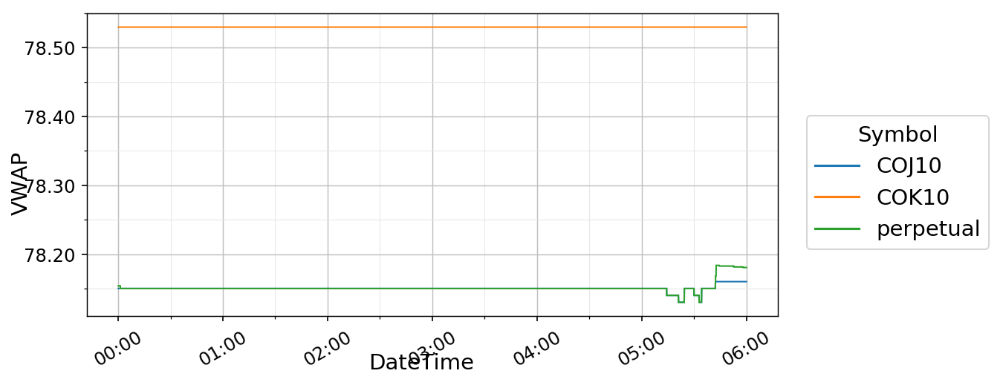

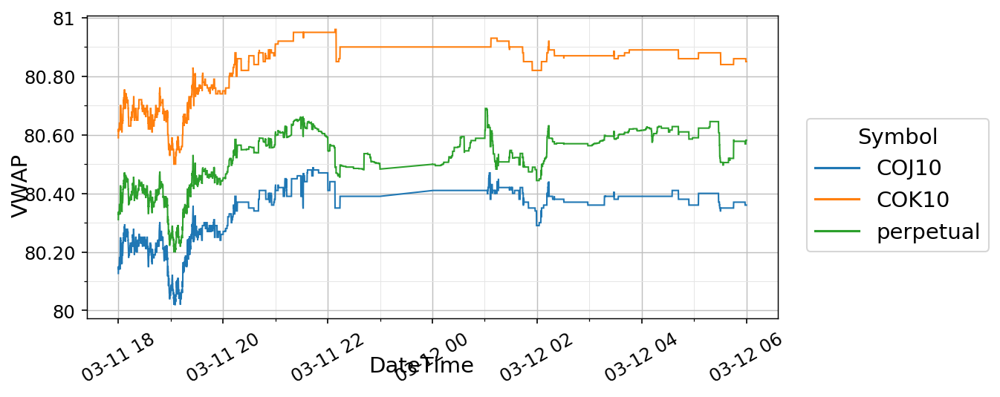

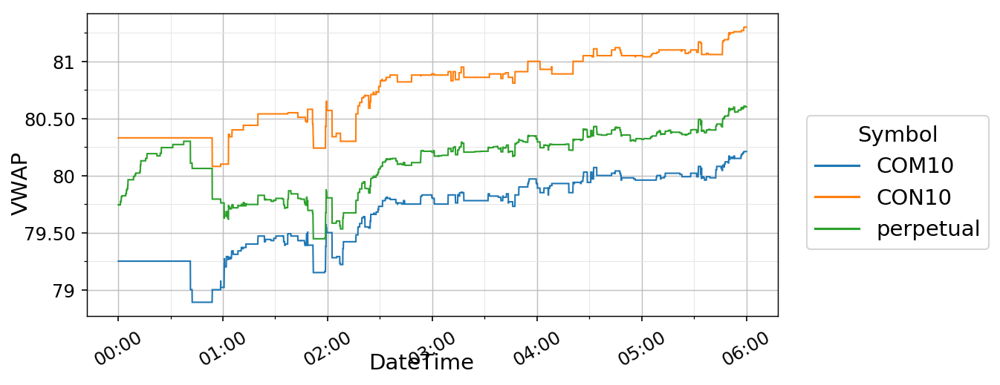

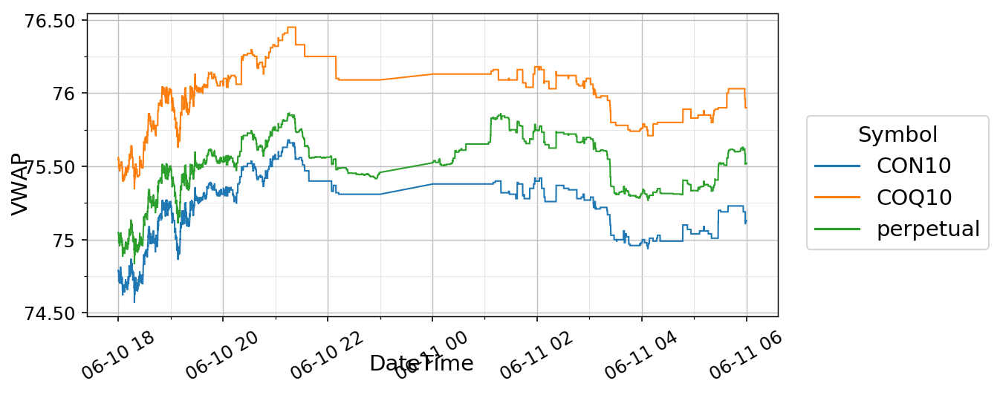

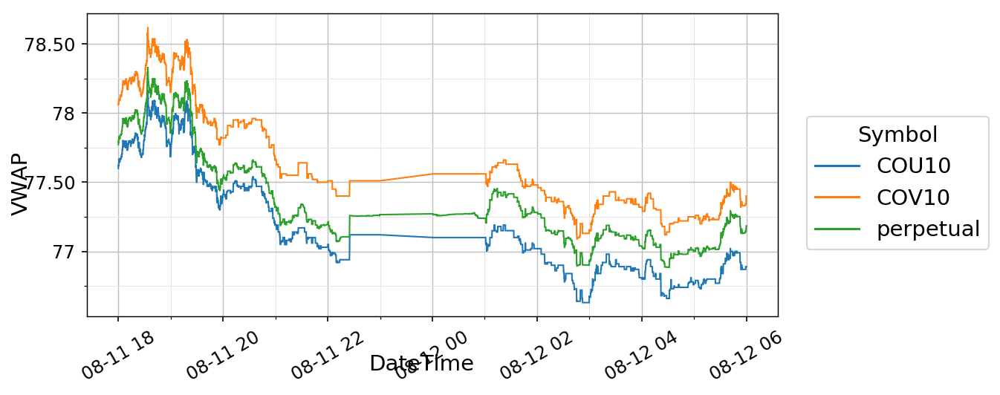

...

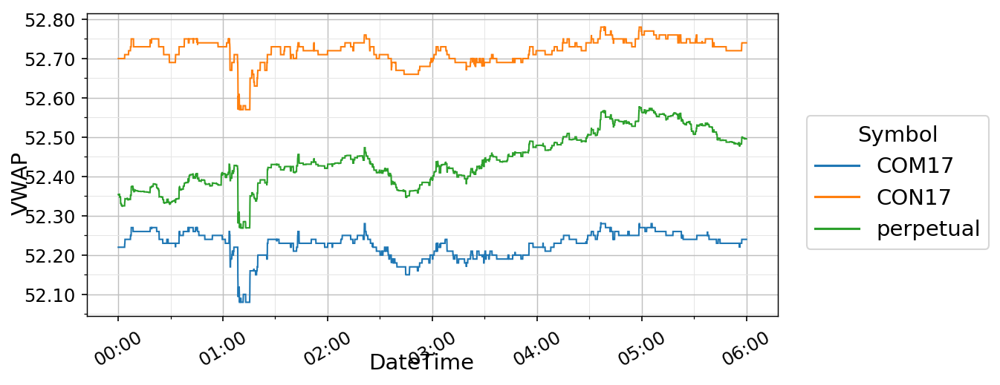

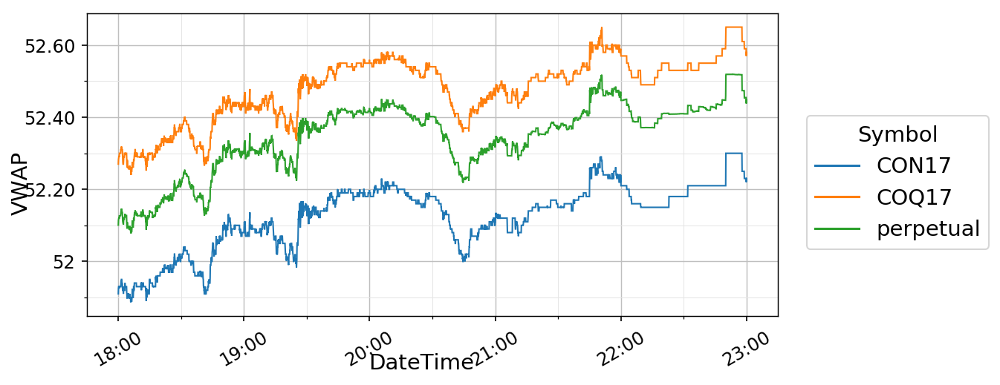

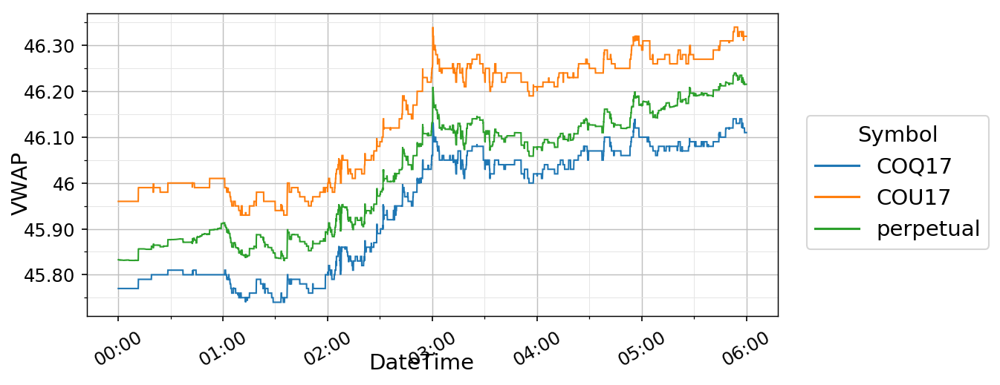

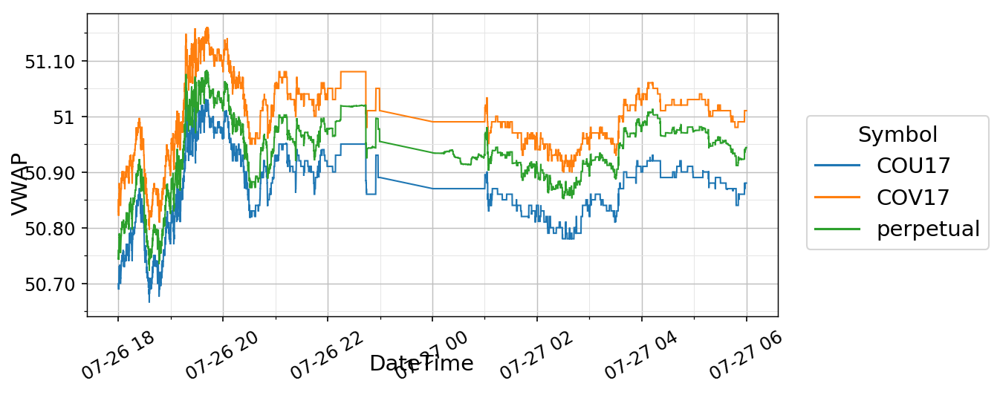

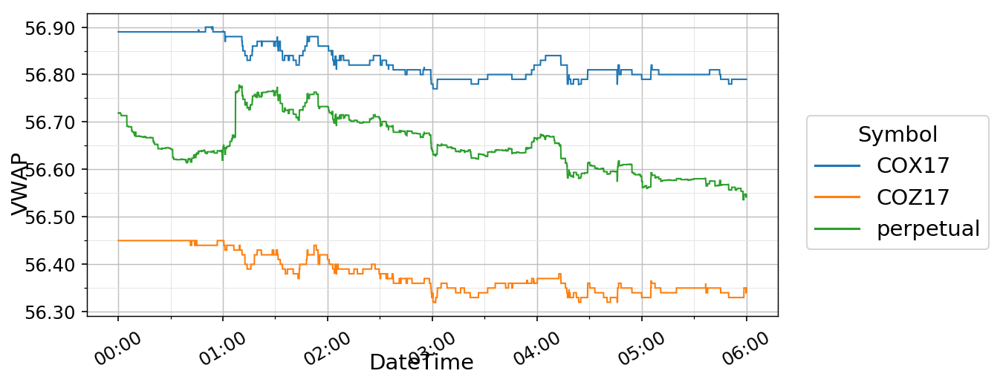

In [30]:
for d in expiration_dates['start_trading_live'].tolist():
    
    i = d - datetime.timedelta(hours=6)
    f = d + datetime.timedelta(hours=6)
    
    mask = (all_contracts.index>=i) & (all_contracts.index<=f)
    tmp1=all_contracts.loc[mask, :]
    
    mask = (perpetual_ts.index>=i) & (perpetual_ts.index<=f)
    tmp2=perpetual_ts.loc[mask, :]
    
    tmp = pd.concat([tmp1, tmp2]).reset_index()
    
    
    try:
        p = line_plot(tmp, 'DateTime', 'VWAP', 'Symbol', lw=1, figsize=(8,4))
        #p = line_plot(tmp, 'DateTime', 'OpenBidPrice', 'Symbol', lw=1, figsize=(8,4))
    except:
        pass

/home/cqc5/anaconda3/envs/tensorflow_cpu/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


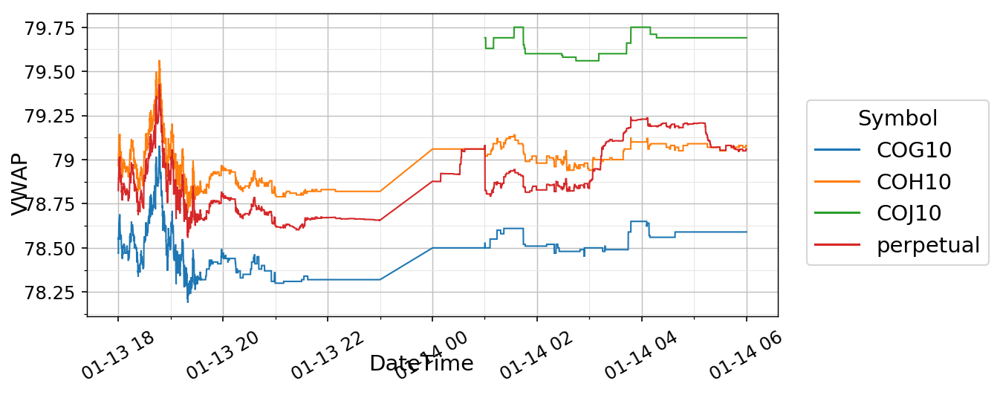

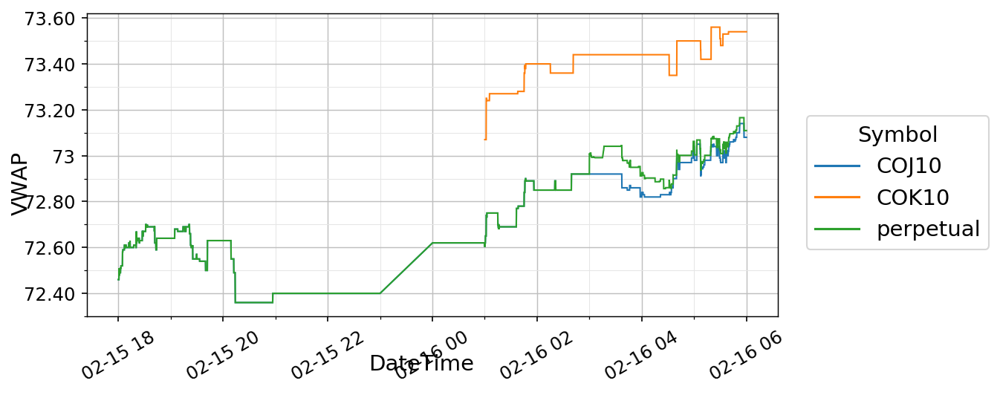

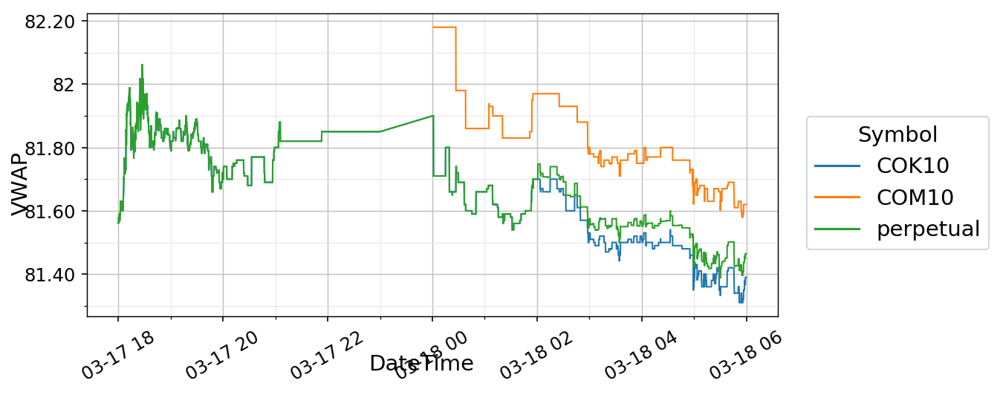

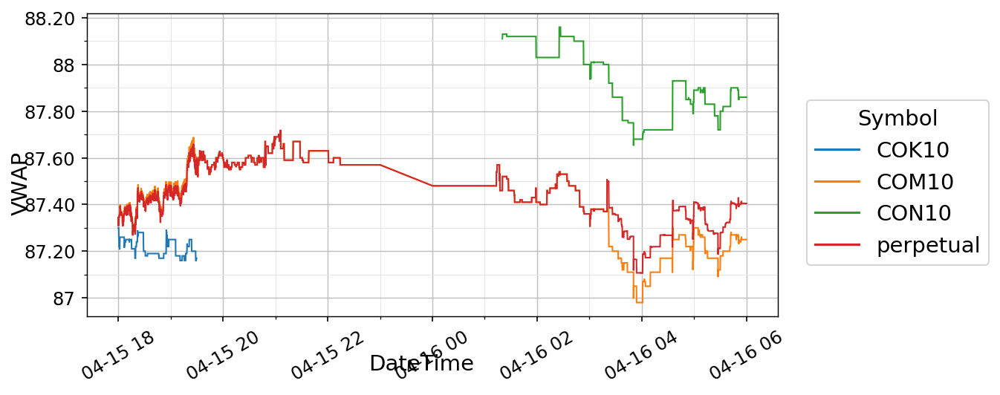

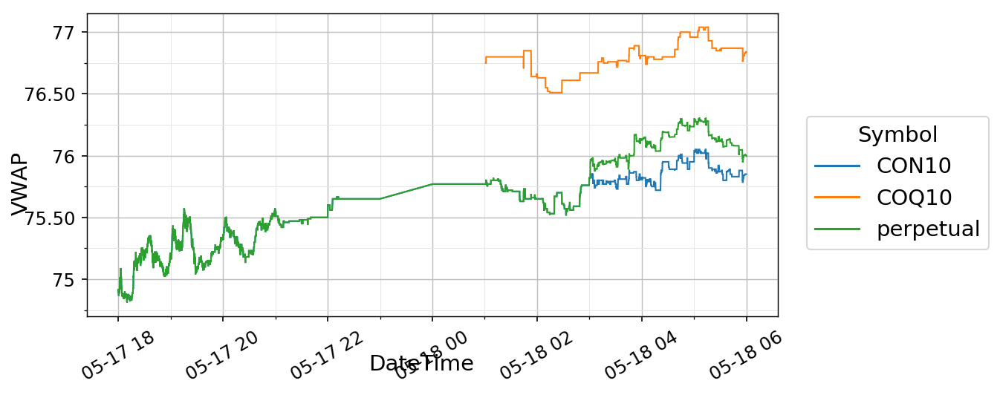

...

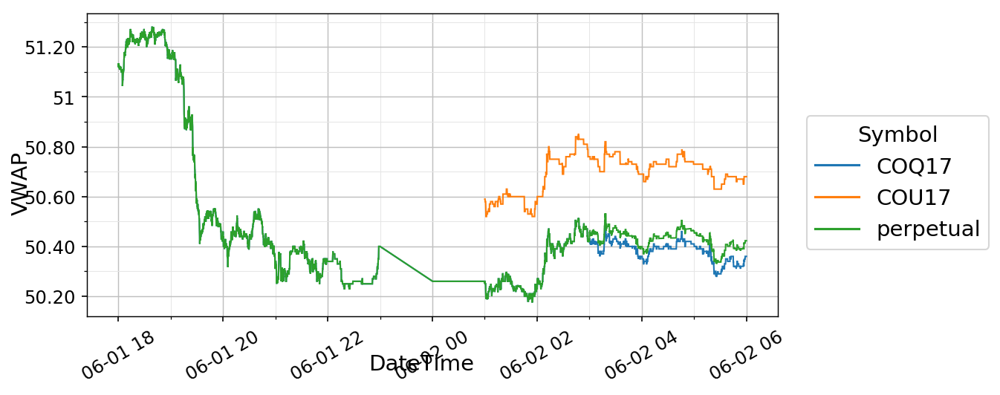

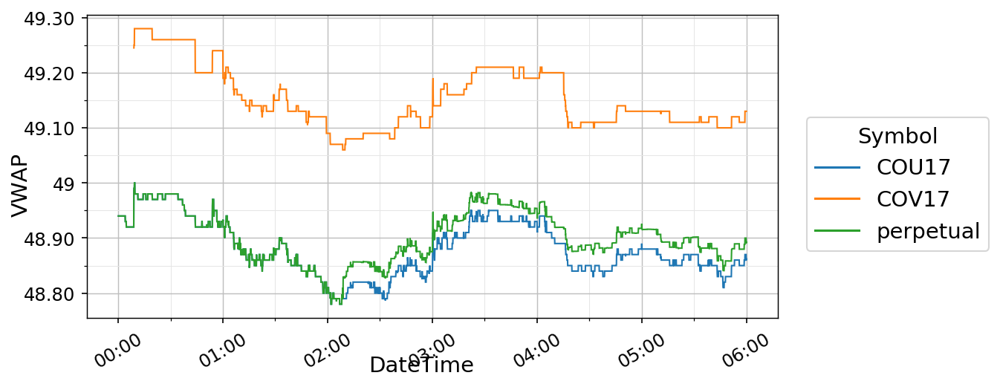

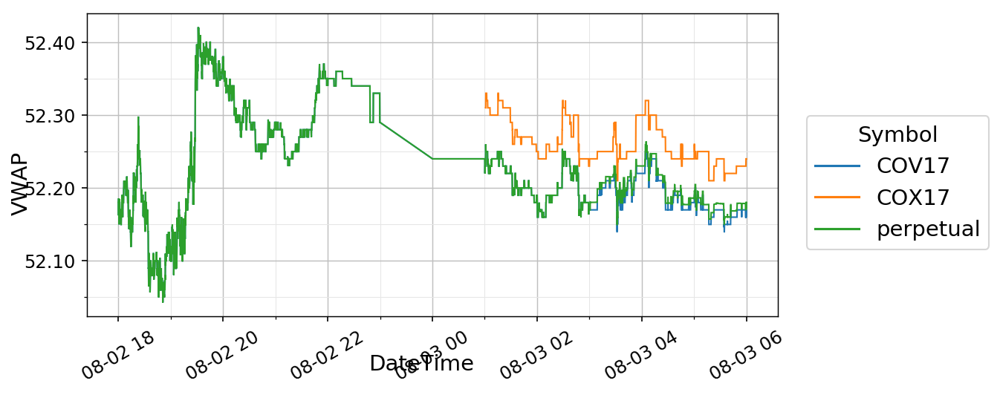

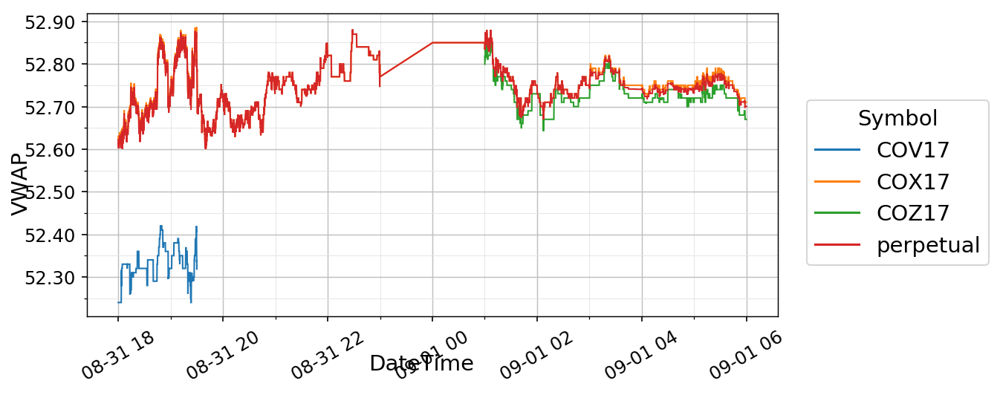

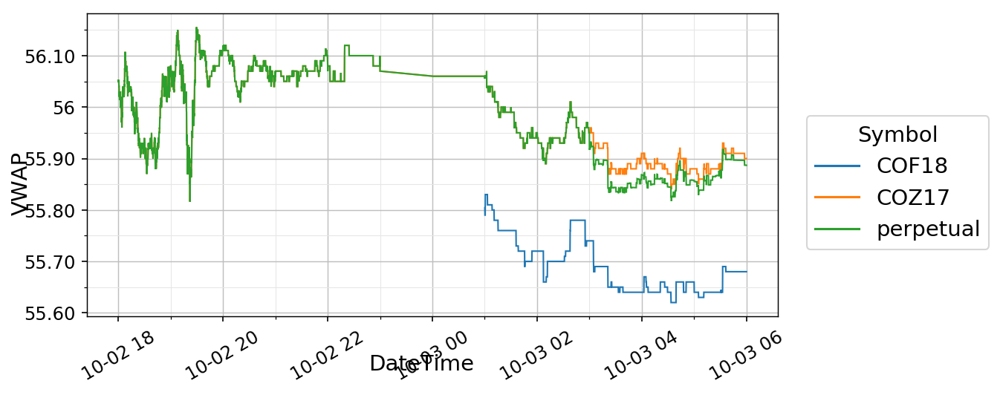

In [31]:
for d in expiration_dates['data_start'].tolist():
    
    i = d - datetime.timedelta(hours=6)
    f = d + datetime.timedelta(hours=6)
    
    mask = (all_contracts.index>=i) & (all_contracts.index<=f)
    tmp1=all_contracts.loc[mask, :]
    
    mask = (perpetual_ts.index>=i) & (perpetual_ts.index<=f)
    tmp2=perpetual_ts.loc[mask, :]
    
    tmp = pd.concat([tmp1, tmp2]).reset_index()
    
    
    try:
        p = line_plot(tmp, 'DateTime', 'VWAP', 'Symbol', lw=1, figsize=(8,4))
        #p = line_plot(tmp, 'DateTime', 'OpenBidPrice', 'Symbol', lw=1, figsize=(8,4))
    except:
        pass

# Build bar objects for perpetual and first contract

In [32]:
import arrow_utils.datatypes as dtypes
from cleaning_functions import OilClean

## First contract

In [33]:
# load data
df = pd.read_pickle('../clean_data/first_contract_5S.pickle')

In [34]:
config_params = {
'trading_session': ('00:00:05', '23:00:00'),
'second_resolution': 5,
'index_from_df': True,
'verbose':True}

config = dtypes.UserInputParser(**config_params)

clean_obj = OilClean(df, config)
bar = clean_obj()

# save bar object
bar.to_pickle('../clean_data/bar_obj_first_contract_5S.pickle')

2018-08-08 15:34:38,913 - arrow_utils.datatypes.TimeBarCleaning - __init__ - INFO - --Initializing cleaning object--
2018-08-08 15:34:38,914 - arrow_utils.datatypes.TimeBarCleaning - __init__ - WARNING - Input df is referenced to self.df therefore df may be modified as well during the cleaning process.
2018-08-08 15:34:38,915 - arrow_utils.datatypes.TimeBarCleaning - print_nan_report - INFO - 
---NaN report---

2018-08-08 15:34:45,408 - arrow_utils.datatypes.TimeBarCleaning - print_nan_report - INFO - 
-Count of NaNs--Percentage-
                 count  pct
Open                 0  0.0
Close                0  0.0
High                 0  0.0
Low                  0  0.0
Volume               0  0.0
TickCount            0  0.0
VWAP                 0  0.0
VWAP2                0  0.0
sigma_VWAP           0  0.0
date                 0  0.0
Symbol               0  0.0
is_live_trading      0  0.0

2018-08-08 15:34:45,409 - arrow_utils.datatypes.TimeBarCleaning - print_nan_report - INFO - 
---End

In [35]:
del df, clean_obj, bar
gc.collect()

307

## Perpetual Time Series

In [36]:
# load data
df = pd.read_pickle('../clean_data/perpetual_ts_5S.pickle')

In [37]:
config_params = {
'trading_session': ('00:00:05', '23:00:00'),
'second_resolution': 5,
'index_from_df': True,
'verbose':True}

config = dtypes.UserInputParser(**config_params)

clean_obj = OilClean(df, config)
bar = clean_obj()

# save bar object
bar.to_pickle('../clean_data/bar_obj_perpetual_ts_5S.pickle')

2018-08-08 15:38:49,643 - arrow_utils.datatypes.TimeBarCleaning - __init__ - INFO - --Initializing cleaning object--
2018-08-08 15:38:49,643 - arrow_utils.datatypes.TimeBarCleaning - __init__ - WARNING - Input df is referenced to self.df therefore df may be modified as well during the cleaning process.
2018-08-08 15:38:49,645 - arrow_utils.datatypes.TimeBarCleaning - print_nan_report - INFO - 
---NaN report---

2018-08-08 15:38:56,615 - arrow_utils.datatypes.TimeBarCleaning - print_nan_report - INFO - 
-Count of NaNs--Percentage-
             count       pct
Open          1439  0.004323
Close         1439  0.004323
High          1439  0.004323
Low           1439  0.004323
VWAP          1439  0.004323
Volume           0  0.000000
TickCount        0  0.000000
sigma2_VWAP   1439  0.004323
sigma_VWAP       0  0.000000
VWAP2         1439  0.004323

2018-08-08 15:38:56,616 - arrow_utils.datatypes.TimeBarCleaning - print_nan_report - INFO - 
---End of NaN report---

2018-08-08 15:39:00,605 - 